<a href="https://colab.research.google.com/github/carloidangelo/ECSE-415/blob/main/Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Assignment 2: Image Matching and Face Detection

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44

In [ ]:
import matplotlib.pyplot as plt

import cv2
import numpy as np
import math

import os
import random

%matplotlib inline

path = '/content/drive/My Drive/ECSE415/Assignments/A2/'

In [ ]:
# function detects and returns SIFT features
def sift_keypoints(img,mask):
  # Create a SIFT object
  sift = cv2.xfeatures2d.SIFT_create()
  # detect SIFT features in image
  keypoints = sift.detect(img, mask)
  return keypoints

In [ ]:
# function computes and returns SIFT descriptors
def sift_descriptors(img,keypoints):
  # Create a SIFT object
  sift = cv2.xfeatures2d.SIFT_create()
  # compute SIFT descriptors
  # computes descriptors for detected keypoints
  keypoints, descriptors = sift.compute(img, keypoints)
  return descriptors

In [ ]:
# function returns single image with all matching keypoints
def match_all_keypoints(img1, keypoints1, descriptors1, img2, keypoints2, descriptors2):
  # create BFMatcher object 
  bf = cv2.BFMatcher()

  # Match descriptors.
  matches = bf.match(descriptors1,descriptors2)

  # Draw first 10 matches.
  img_match = cv2.drawMatches(img1,keypoints1,img2,keypoints2, matches[:], None, flags=2)

  return img_match

In [ ]:
# function returns single image with top ten matching keypoints
def match_topten_keypoints(img1, keypoints1, descriptors1, img2, keypoints2, descriptors2):
  # create BFMatcher object 
  bf = cv2.BFMatcher()

  # Match descriptors.
  matches = bf.match(descriptors1,descriptors2)

  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)

  # Draw first 10 matches.
  img_match = cv2.drawMatches(img1,keypoints1,img2,keypoints2, matches[:10], None, flags=2)

  return img_match

##Invariance of SIFT Features

###Invariance Under Changes in Scale


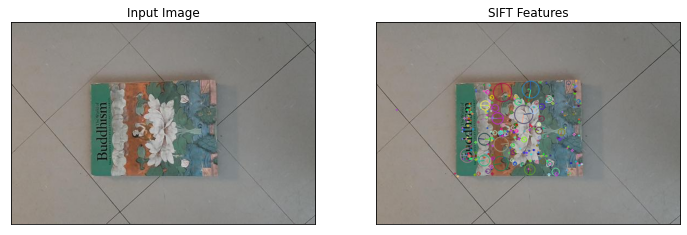

In [ ]:
# load image 
img_book = cv2.imread(path+"book.jpg")

# copy image
img_disp_book = img_book.copy()

# convert to RGB
img_book = cv2.cvtColor(img_book, cv2.COLOR_BGR2RGB)
img_disp_book = cv2.cvtColor(img_disp_book, cv2.COLOR_BGR2RGB)

# find SIFT keypoints
keypoints_book = sift_keypoints(img_book,None)

# draw the keypoints
cv2.drawKeypoints(img_book, keypoints_book, img_disp_book, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(12,10))
plt.subplot(121), plt.imshow(img_book)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp_book)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

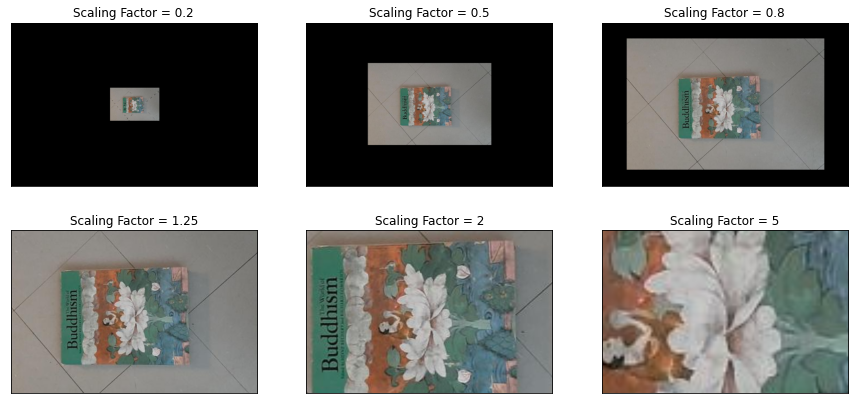

In [ ]:
# Create a scaled duplicates

# image size
height, width = img_book.shape[0:2]

# SCALE = 0.2
# create transformation matrix
M_0_2 = cv2.getRotationMatrix2D((width/2,height/2),0,0.2)
# Apply the transformation matrix
img_book_0_2 = cv2.warpAffine(img_book,M_0_2,(width,height))

# SCALE = 0.5
# create transformation matrix
M_0_5 = cv2.getRotationMatrix2D((width/2,height/2),0,0.5)
# Apply the transformation matrix
img_book_0_5 = cv2.warpAffine(img_book,M_0_5,(width,height))

# SCALE = 0.8
# create transformation matrix
M_0_8 = cv2.getRotationMatrix2D((width/2,height/2),0,0.8)
# Apply the transformation matrix
img_book_0_8 = cv2.warpAffine(img_book,M_0_8,(width,height))

# SCALE = 1.25
# create transformation matrix
M_1_25 = cv2.getRotationMatrix2D((width/2,height/2),0,1.25)
# Apply the transformation matrix
img_book_1_25 = cv2.warpAffine(img_book,M_1_25,(width,height))

# SCALE = 2
# create transformation matrix
M_2 = cv2.getRotationMatrix2D((width/2,height/2),0,2)
# Apply the transformation matrix
img_book_2 = cv2.warpAffine(img_book,M_2,(width,height))

# SCALE = 5
# create transformation matrix
M_5 = cv2.getRotationMatrix2D((width/2,height/2),0,5)
# Apply the transformation matrix
img_book_5 = cv2.warpAffine(img_book,M_5,(width,height))

# display
plt.figure(figsize=(15,7))
plt.subplot(231), plt.imshow(img_book_0_2)
plt.title("Scaling Factor = 0.2"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img_book_0_5)
plt.title("Scaling Factor = 0.5"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img_book_0_8)
plt.title("Scaling Factor = 0.8"), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(img_book_1_25)
plt.title("Scaling Factor = 1.25"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(img_book_2)
plt.title("Scaling Factor = 2"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(img_book_5)
plt.title("Scaling Factor = 5"), plt.xticks([]), plt.yticks([])
plt.show()

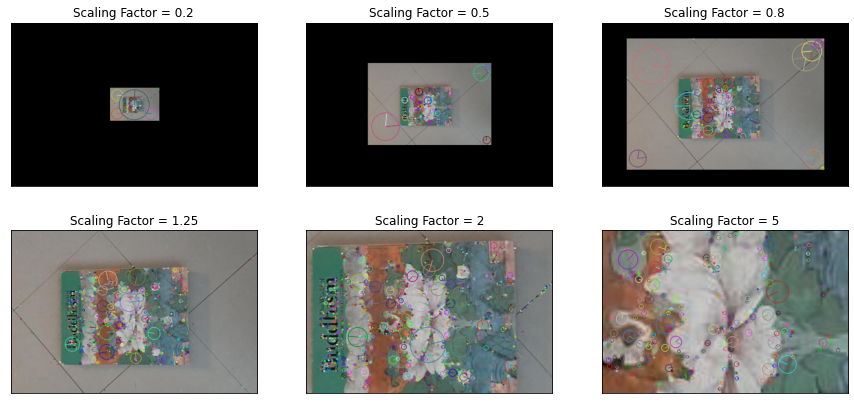

In [ ]:
# copy transformed images
img_disp_book_0_2 = img_book_0_2.copy()
img_disp_book_0_5 = img_book_0_5.copy()
img_disp_book_0_8 = img_book_0_8.copy()
img_disp_book_1_25 = img_book_1_25.copy()
img_disp_book_2 = img_book_2.copy()
img_disp_book_5 = img_book_5.copy()

# white image with same dimensions as input image (helps create mask)
mask = np.full((height,width), 255, np.uint8)

# SCALE = 0.2
# create mask
mask_0_2 = cv2.warpAffine(mask,M_0_2,(width,height))
# find SIFT keypoints
keypoints_book_0_2 = sift_keypoints(img_book_0_2,mask_0_2)
# draw the keypoints
cv2.drawKeypoints(img_book_0_2, keypoints_book_0_2, img_disp_book_0_2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# SCALE = 0.5
# create mask
mask_0_5 = cv2.warpAffine(mask,M_0_5,(width,height))
# find SIFT keypoints
keypoints_book_0_5 = sift_keypoints(img_book_0_5,mask_0_5)
# draw the keypoints
cv2.drawKeypoints(img_book_0_5, keypoints_book_0_5, img_disp_book_0_5, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# SCALE = 0.8
# create mask
mask_0_8 = cv2.warpAffine(mask,M_0_8,(width,height))
# find SIFT keypoints
keypoints_book_0_8 = sift_keypoints(img_book_0_8,mask_0_8)
# draw the keypoints
cv2.drawKeypoints(img_book_0_8, keypoints_book_0_8, img_disp_book_0_8, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# SCALE = 1.25
# find SIFT keypoints
keypoints_book_1_25 = sift_keypoints(img_book_1_25,None)
# draw the keypoints
cv2.drawKeypoints(img_book_1_25, keypoints_book_1_25, img_disp_book_1_25, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# SCALE = 2
# find SIFT keypoints
keypoints_book_2 = sift_keypoints(img_book_2,None)
# draw the keypoints
cv2.drawKeypoints(img_book_2, keypoints_book_2, img_disp_book_2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# SCALE = 5
# find SIFT keypoints
keypoints_book_5 = sift_keypoints(img_book_5,None)
# draw the keypoints
cv2.drawKeypoints(img_book_5, keypoints_book_5, img_disp_book_5, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(15,7))
plt.subplot(231), plt.imshow(img_disp_book_0_2)
plt.title("Scaling Factor = 0.2"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img_disp_book_0_5)
plt.title("Scaling Factor = 0.5"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img_disp_book_0_8)
plt.title("Scaling Factor = 0.8"), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(img_disp_book_1_25)
plt.title("Scaling Factor = 1.25"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(img_disp_book_2)
plt.title("Scaling Factor = 2"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(img_disp_book_5)
plt.title("Scaling Factor = 5"), plt.xticks([]), plt.yticks([])
plt.show()

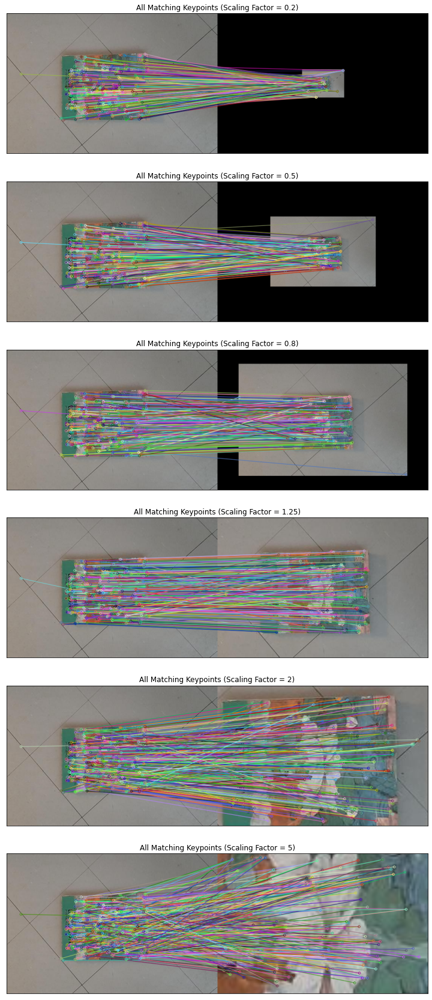

In [ ]:
# SCALE = 0.2
# display all matching keypoints
match_all_0_2 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_2, keypoints_book_0_2, sift_descriptors(img_book_0_2,keypoints_book_0_2))

# SCALE = 0.5
# display all matching keypoints
match_all_0_5 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_5, keypoints_book_0_5, sift_descriptors(img_book_0_5,keypoints_book_0_5))

# SCALE = 0.8
# display all matching keypoints
match_all_0_8 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_8, keypoints_book_0_8, sift_descriptors(img_book_0_8,keypoints_book_0_8))

# SCALE = 1.25
# display all matching keypoints
match_all_1_25 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_1_25, keypoints_book_1_25, sift_descriptors(img_book_1_25,keypoints_book_1_25))

# SCALE = 2
# display all matching keypoints
match_all_2 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_2, keypoints_book_2, sift_descriptors(img_book_2,keypoints_book_2))

# SCALE = 5
# display all matching keypoints
match_all_5 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_5, keypoints_book_5, sift_descriptors(img_book_5,keypoints_book_5))

# display
plt.figure(figsize=(30,30))
plt.subplot(611), plt.imshow(match_all_0_2)
plt.title("All Matching Keypoints (Scaling Factor = 0.2)"), plt.xticks([]), plt.yticks([])
plt.subplot(612), plt.imshow(match_all_0_5)
plt.title("All Matching Keypoints (Scaling Factor = 0.5)"), plt.xticks([]), plt.yticks([])
plt.subplot(613), plt.imshow(match_all_0_8)
plt.title("All Matching Keypoints (Scaling Factor = 0.8)"), plt.xticks([]), plt.yticks([])
plt.subplot(614), plt.imshow(match_all_1_25)
plt.title("All Matching Keypoints (Scaling Factor = 1.25)"), plt.xticks([]), plt.yticks([])
plt.subplot(615), plt.imshow(match_all_2)
plt.title("All Matching Keypoints (Scaling Factor = 2)"), plt.xticks([]), plt.yticks([])
plt.subplot(616), plt.imshow(match_all_5)
plt.title("All Matching Keypoints (Scaling Factor = 5)"), plt.xticks([]), plt.yticks([])
plt.show()

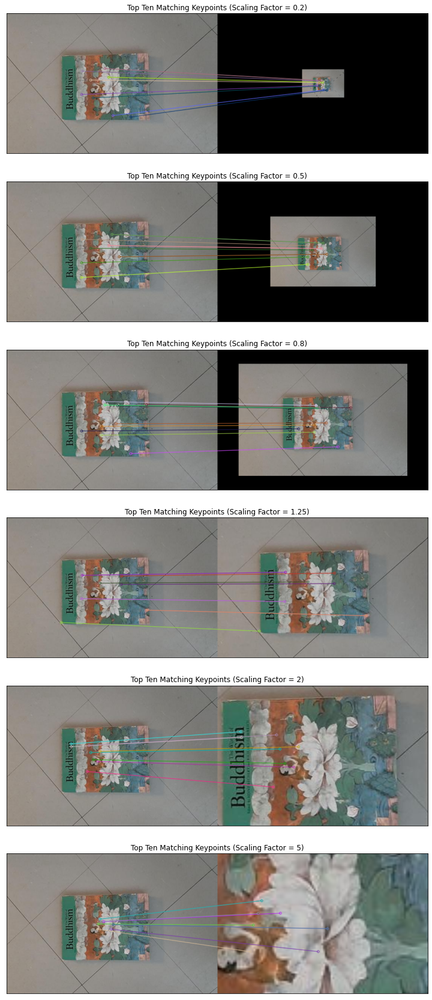

In [ ]:
# SCALE = 0.2
# display top ten matching keypoints
match_topten_0_2 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_2, keypoints_book_0_2, sift_descriptors(img_book_0_2,keypoints_book_0_2))

# SCALE = 0.5
# display top ten matching keypoints
match_topten_0_5 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_5, keypoints_book_0_5, sift_descriptors(img_book_0_5,keypoints_book_0_5))

# SCALE = 0.8
# display top ten matching keypoints
match_topten_0_8 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_0_8, keypoints_book_0_8, sift_descriptors(img_book_0_8,keypoints_book_0_8))

# SCALE = 1.25
# display top ten matching keypoints
match_topten_1_25 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_1_25, keypoints_book_1_25, sift_descriptors(img_book_1_25,keypoints_book_1_25))

# SCALE = 2
# display top ten matching keypoints
match_topten_2 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_2, keypoints_book_2, sift_descriptors(img_book_2,keypoints_book_2))

# SCALE = 5
# display top ten matching keypoints
match_topten_5 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_5, keypoints_book_5, sift_descriptors(img_book_5,keypoints_book_5))

# display
plt.figure(figsize=(30,30))
plt.subplot(611), plt.imshow(match_topten_0_2)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 0.2)"), plt.xticks([]), plt.yticks([])
plt.subplot(612), plt.imshow(match_topten_0_5)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 0.5)"), plt.xticks([]), plt.yticks([])
plt.subplot(613), plt.imshow(match_topten_0_8)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 0.8)"), plt.xticks([]), plt.yticks([])
plt.subplot(614), plt.imshow(match_topten_1_25)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 1.25)"), plt.xticks([]), plt.yticks([])
plt.subplot(615), plt.imshow(match_topten_2)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 2)"), plt.xticks([]), plt.yticks([])
plt.subplot(616), plt.imshow(match_topten_5)
plt.title("Top Ten Matching Keypoints (Scaling Factor = 5)"), plt.xticks([]), plt.yticks([])
plt.show()

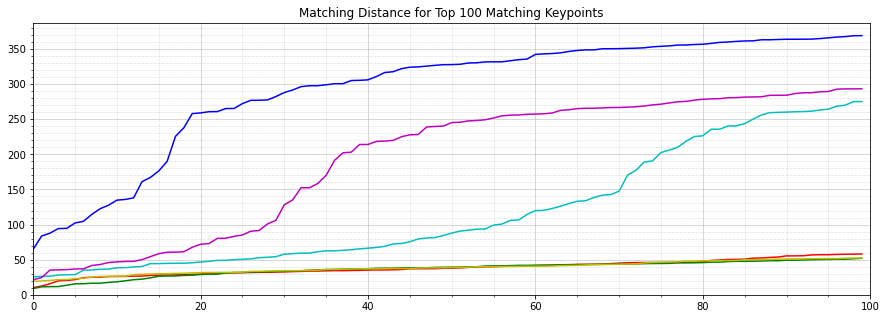

Blue Line: Scaling Factor = 0.2
Cyan Line: Scaling Factor = 0.5
Red Line: Scaling Factor = 0.8
Green Line: Scaling Factor = 1.25
Yellow Line: Scaling Factor = 2
Magenta Line: Scaling Factor = 5



In [ ]:
# create BFMatcher object 
bf = cv2.BFMatcher()

img_book_scaled = [img_book_0_2,img_book_0_5,img_book_0_8,img_book_1_25,img_book_2,img_book_5]
keypoints_book_scaled = [keypoints_book_0_2,keypoints_book_0_5,keypoints_book_0_8,keypoints_book_1_25,keypoints_book_2,keypoints_book_5]
distances_scaled = []

for i in range(6):
  # Match descriptors.
  matches = bf.match(sift_descriptors(img_book,keypoints_book),sift_descriptors(img_book_scaled[i],keypoints_book_scaled[i])) 

  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)

  # get matching distances
  distances = []
  for i in range(100):
    distances.append(matches[i].distance)
  
  distances_scaled.append(distances)

# display graph
plt.figure(figsize=(15,5))
colors = ['b', 'c', 'r', 'g', 'y', 'm']
for i in range(6):
    plt.plot(distances_scaled[i], color=colors[i])
plt.title("Matching Distance for Top 100 Matching Keypoints"), plt.xlim([0, 100]), plt.ylim(0)
plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5') 
plt.show()
print("Blue Line: Scaling Factor = 0.2\n" + "Cyan Line: Scaling Factor = 0.5\n" + "Red Line: Scaling Factor = 0.8\n" +
      "Green Line: Scaling Factor = 1.25\n" + "Yellow Line: Scaling Factor = 2\n" + "Magenta Line: Scaling Factor = 5\n")

In general, SIFT descriptors are invariant with respect to scaling transformations. However, these plotted results show that this statement is true only between certain scaling factors. When the scaling factor is 5 or 0.2, for example, it actually results in larger matching distances. This phenomenon occurs because the reference image is scaled up/down by so much that the pixels around the SIFT keypoints do not contain the same information as before the transformation.

###Invariance Under Rotation

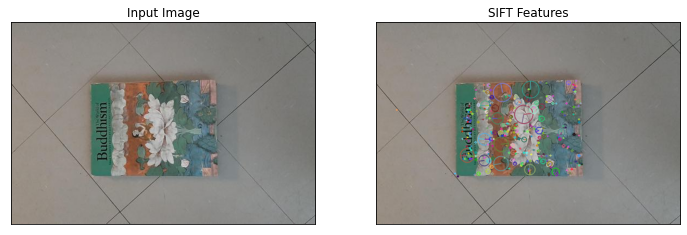

In [ ]:
# load image 
img_book = cv2.imread(path+"book.jpg")

# copy image
img_disp_book = img_book.copy()

# convert to RGB
img_book = cv2.cvtColor(img_book, cv2.COLOR_BGR2RGB)
img_disp_book = cv2.cvtColor(img_disp_book, cv2.COLOR_BGR2RGB)

# find SIFT keypoints
keypoints_book = sift_keypoints(img_book,None)

# draw the keypoints
cv2.drawKeypoints(img_book, keypoints_book, img_disp_book, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(12,10))
plt.subplot(121), plt.imshow(img_book)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img_disp_book)
plt.title("SIFT Features"), plt.xticks([]), plt.yticks([])
plt.show()

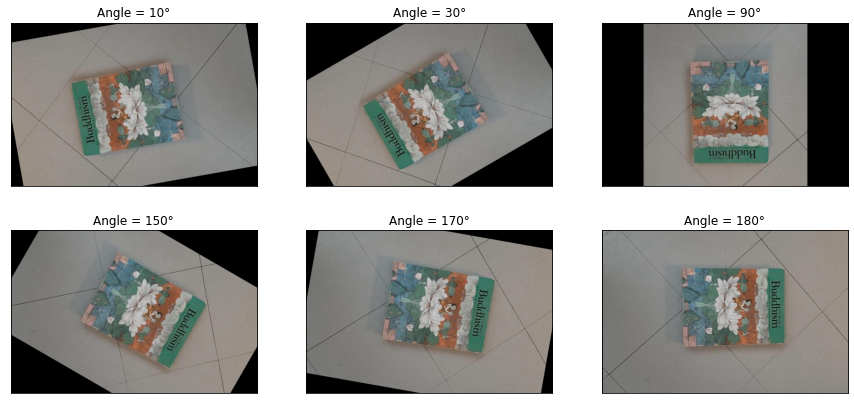

In [ ]:
# Create rotated duplicates

# image size
height, width = img_book.shape[0:2]

# ANGLE = 10°
# create transformation matrix
M_10 = cv2.getRotationMatrix2D((width/2,height/2),10,1)
# Apply the transformation matrix
img_book_10 = cv2.warpAffine(img_book,M_10,(width,height))

# ANGLE = 30°
# create transformation matrix
M_30 = cv2.getRotationMatrix2D((width/2,height/2),30,1)
# Apply the transformation matrix
img_book_30 = cv2.warpAffine(img_book,M_30,(width,height))

# ANGLE = 90°
# create transformation matrix
M_90 = cv2.getRotationMatrix2D((width/2,height/2),90,1)
# Apply the transformation matrix
img_book_90 = cv2.warpAffine(img_book,M_90,(width,height))

# ANGLE = 150°
# create transformation matrix
M_150 = cv2.getRotationMatrix2D((width/2,height/2),150,1)
# Apply the transformation matrix
img_book_150 = cv2.warpAffine(img_book,M_150,(width,height))

# ANGLE = 170°
# create transformation matrix
M_170 = cv2.getRotationMatrix2D((width/2,height/2),170,1)
# Apply the transformation matrix
img_book_170 = cv2.warpAffine(img_book,M_170,(width,height))

# ANGLE = 180°
# create transformation matrix
M_180 = cv2.getRotationMatrix2D((width/2,height/2),180,1)
# Apply the transformation matrix
img_book_180 = cv2.warpAffine(img_book,M_180,(width,height))

# display
plt.figure(figsize=(15,7))
plt.subplot(231), plt.imshow(img_book_10)
plt.title("Angle = 10°"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img_book_30)
plt.title("Angle = 30°"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img_book_90)
plt.title("Angle = 90°"), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(img_book_150)
plt.title("Angle = 150°"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(img_book_170)
plt.title("Angle = 170°"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(img_book_180)
plt.title("Angle = 180°"), plt.xticks([]), plt.yticks([])
plt.show()

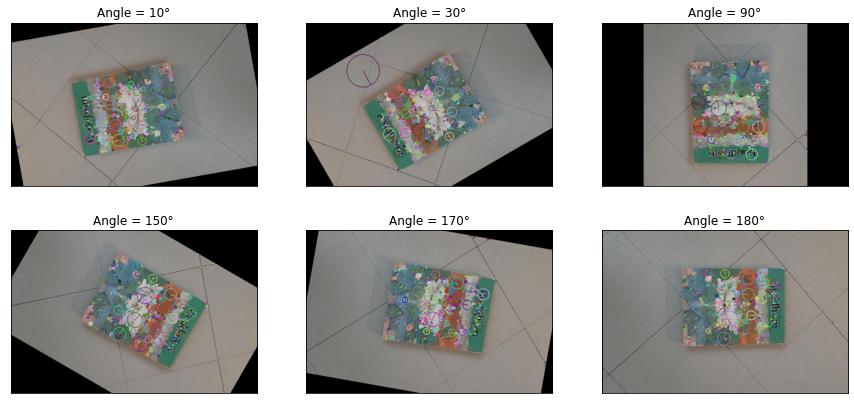

In [ ]:
# copy transformed images
img_disp_book_10 = img_book_10.copy()
img_disp_book_30 = img_book_30.copy()
img_disp_book_90 = img_book_90.copy()
img_disp_book_150 = img_book_150.copy()
img_disp_book_170 = img_book_170.copy()
img_disp_book_180 = img_book_180.copy()

# white image with same dimensions as input image (helps create mask)
mask = np.full((height,width), 255, np.uint8)

# ANGLE = 10°
# create mask
mask_10 = cv2.warpAffine(mask,M_10,(width,height))
# find SIFT keypoints
keypoints_book_10 = sift_keypoints(img_book_10,mask_10)
# draw the keypoints
cv2.drawKeypoints(img_book_10, keypoints_book_10, img_disp_book_10, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# ANGLE = 30°
# create mask
mask_30 = cv2.warpAffine(mask,M_30,(width,height))
# find SIFT keypoints
keypoints_book_30 = sift_keypoints(img_book_30,mask_30)
# draw the keypoints
cv2.drawKeypoints(img_book_30, keypoints_book_30, img_disp_book_30, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# ANGLE = 90°
# create mask
mask_90 = cv2.warpAffine(mask,M_90,(width,height))
# find SIFT keypoints
keypoints_book_90 = sift_keypoints(img_book_90,mask_90)
# draw the keypoints
cv2.drawKeypoints(img_book_90, keypoints_book_90, img_disp_book_90, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# ANGLE = 150°
# create mask
mask_150 = cv2.warpAffine(mask,M_150,(width,height))
# find SIFT keypoints
keypoints_book_150 = sift_keypoints(img_book_150,mask_150)
# draw the keypoints
cv2.drawKeypoints(img_book_150, keypoints_book_150, img_disp_book_150, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# ANGLE = 170°
# create mask
mask_170 = cv2.warpAffine(mask,M_170,(width,height))
# find SIFT keypoints
keypoints_book_170 = sift_keypoints(img_book_170,mask_170)
# draw the keypoints
cv2.drawKeypoints(img_book_170, keypoints_book_170, img_disp_book_170, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# ANGLE = 180°
# find SIFT keypoints
keypoints_book_180 = sift_keypoints(img_book_180,None)
# draw the keypoints
cv2.drawKeypoints(img_book_180, keypoints_book_180, img_disp_book_180, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(15,7))
plt.subplot(231), plt.imshow(img_disp_book_10)
plt.title("Angle = 10°"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(img_disp_book_30)
plt.title("Angle = 30°"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(img_disp_book_90)
plt.title("Angle = 90°"), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(img_disp_book_150)
plt.title("Angle = 150°"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(img_disp_book_170)
plt.title("Angle = 170°"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(img_disp_book_180)
plt.title("Angle = 180°"), plt.xticks([]), plt.yticks([])
plt.show()

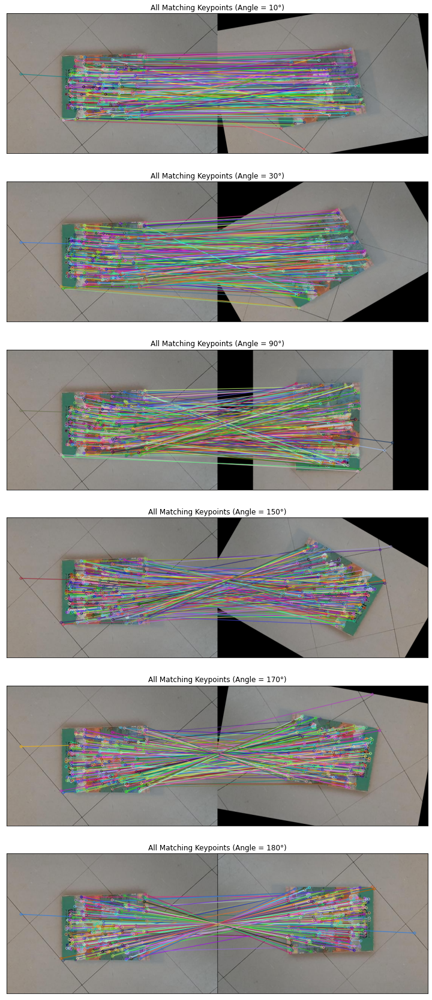

In [ ]:
# ANGLE = 10°
# display all matching keypoints
match_all_10 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_10, keypoints_book_10, sift_descriptors(img_book_10,keypoints_book_10))

# ANGLE = 30°
# display all matching keypoints
match_all_30 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_30, keypoints_book_30, sift_descriptors(img_book_30,keypoints_book_30))

# ANGLE = 90°
# display all matching keypoints
match_all_90 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_90, keypoints_book_90, sift_descriptors(img_book_90,keypoints_book_90))

# ANGLE = 150°
# display all matching keypoints
match_all_150 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_150, keypoints_book_150, sift_descriptors(img_book_150,keypoints_book_150))

# ANGLE = 170°
# display all matching keypoints
match_all_170 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_170, keypoints_book_170, sift_descriptors(img_book_170,keypoints_book_170))

# ANGLE = 180°
# display all matching keypoints
match_all_180 = match_all_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_180, keypoints_book_180, sift_descriptors(img_book_180,keypoints_book_180))

# display
plt.figure(figsize=(30,30))
plt.subplot(611), plt.imshow(match_all_10)
plt.title("All Matching Keypoints (Angle = 10°)"), plt.xticks([]), plt.yticks([])
plt.subplot(612), plt.imshow(match_all_30)
plt.title("All Matching Keypoints (Angle = 30°)"), plt.xticks([]), plt.yticks([])
plt.subplot(613), plt.imshow(match_all_90)
plt.title("All Matching Keypoints (Angle = 90°)"), plt.xticks([]), plt.yticks([])
plt.subplot(614), plt.imshow(match_all_150)
plt.title("All Matching Keypoints (Angle = 150°)"), plt.xticks([]), plt.yticks([])
plt.subplot(615), plt.imshow(match_all_170)
plt.title("All Matching Keypoints (Angle = 170°)"), plt.xticks([]), plt.yticks([])
plt.subplot(616), plt.imshow(match_all_180)
plt.title("All Matching Keypoints (Angle = 180°)"), plt.xticks([]), plt.yticks([])
plt.show()

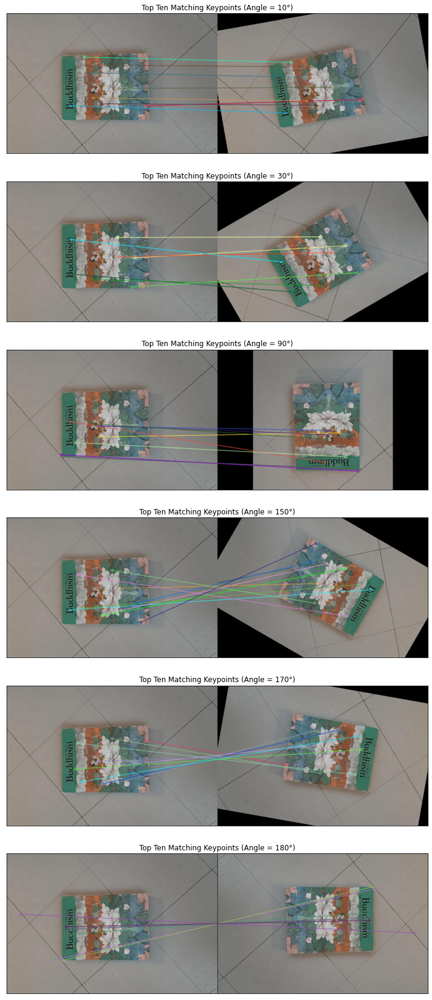

In [ ]:
# ANGLE = 10°
# display top ten matching keypoints
match_topten_10 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_10, keypoints_book_10, sift_descriptors(img_book_10,keypoints_book_10))

# ANGLE = 30°
# display top ten matching keypoints
match_topten_30 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_30, keypoints_book_30, sift_descriptors(img_book_30,keypoints_book_30))

# ANGLE = 90°
# display top ten matching keypoints
match_topten_90 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_90, keypoints_book_90, sift_descriptors(img_book_90,keypoints_book_90))

# ANGLE = 150°
# display top ten matching keypoints
match_topten_150 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_150, keypoints_book_150, sift_descriptors(img_book_150,keypoints_book_150))

# ANGLE = 170°
# display top ten matching keypoints
match_topten_170 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_170, keypoints_book_170, sift_descriptors(img_book_170,keypoints_book_170))

# ANGLE = 180°
# display top ten matching keypoints
match_topten_180 = match_topten_keypoints(img_book, keypoints_book, sift_descriptors(img_book,keypoints_book), 
                                    img_book_180, keypoints_book_180, sift_descriptors(img_book_180,keypoints_book_180))

# display
plt.figure(figsize=(30,30))
plt.subplot(611), plt.imshow(match_topten_10)
plt.title("Top Ten Matching Keypoints (Angle = 10°)"), plt.xticks([]), plt.yticks([])
plt.subplot(612), plt.imshow(match_topten_30)
plt.title("Top Ten Matching Keypoints (Angle = 30°)"), plt.xticks([]), plt.yticks([])
plt.subplot(613), plt.imshow(match_topten_90)
plt.title("Top Ten Matching Keypoints (Angle = 90°)"), plt.xticks([]), plt.yticks([])
plt.subplot(614), plt.imshow(match_topten_150)
plt.title("Top Ten Matching Keypoints (Angle = 150°)"), plt.xticks([]), plt.yticks([])
plt.subplot(615), plt.imshow(match_topten_170)
plt.title("Top Ten Matching Keypoints (Angle = 170°)"), plt.xticks([]), plt.yticks([])
plt.subplot(616), plt.imshow(match_topten_180)
plt.title("Top Ten Matching Keypoints (Angle = 180°)"), plt.xticks([]), plt.yticks([])
plt.show()

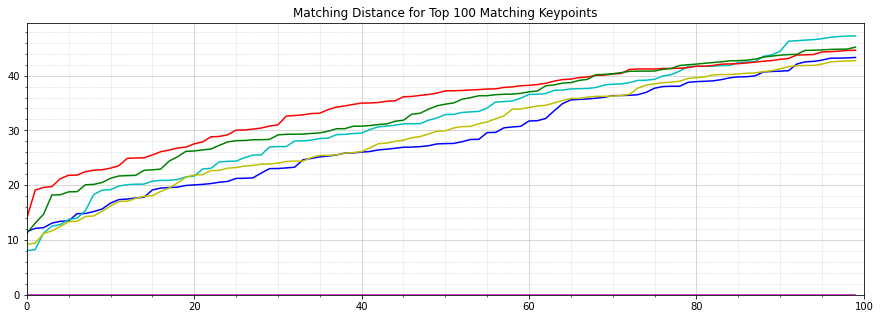

Blue Line: Angle = 10°
Cyan Line: Angle = 30°
Red Line: Angle = 90°
Green Line: Angle = 150°
Yellow Line: Angle = 170°
Magenta Line: Angle = 180°



In [ ]:
# create BFMatcher object 
bf = cv2.BFMatcher()

img_book_rotated = [img_book_10,img_book_30,img_book_90,img_book_150,img_book_170,img_book_180]
keypoints_book_rotated = [keypoints_book_10,keypoints_book_30,keypoints_book_90,keypoints_book_150,keypoints_book_170,keypoints_book_180]
distances_rotated = []

for i in range(6):
  # Match descriptors.
  matches = bf.match(sift_descriptors(img_book,keypoints_book),sift_descriptors(img_book_rotated[i],keypoints_book_rotated[i])) 

  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)

  # get matching distances
  distances = []
  for i in range(100):
    distances.append(matches[i].distance)
  
  distances_rotated.append(distances)

# display graph
plt.figure(figsize=(15,5))
colors = ['b', 'c', 'r', 'g', 'y', 'm']
for i in range(6):
    plt.plot(distances_rotated[i], color=colors[i])
plt.title("Matching Distance for Top 100 Matching Keypoints"), plt.xlim([0, 100]), plt.ylim(0)
plt.minorticks_on()
plt.grid(which='major', linestyle='-', linewidth='0.5')
plt.grid(which='minor', linestyle=':', linewidth='0.5') 
plt.show()
print("Blue Line: Angle = 10°\n" + "Cyan Line: Angle = 30°\n" + "Red Line: Angle = 90°\n" +
      "Green Line: Angle = 150°\n" + "Yellow Line: Angle = 170°\n" + "Magenta Line: Angle = 180°\n")

In general, SIFT descriptors are invariant with respect to rotations. These plotted results confirm this statement. It is true because the pixels around the SIFT keypoints contain the same information as before the transformation. One observation to take note of is that a rotation of 180 degrees results in matching distances of 0.

##Matching using SIFT - Book Reveal

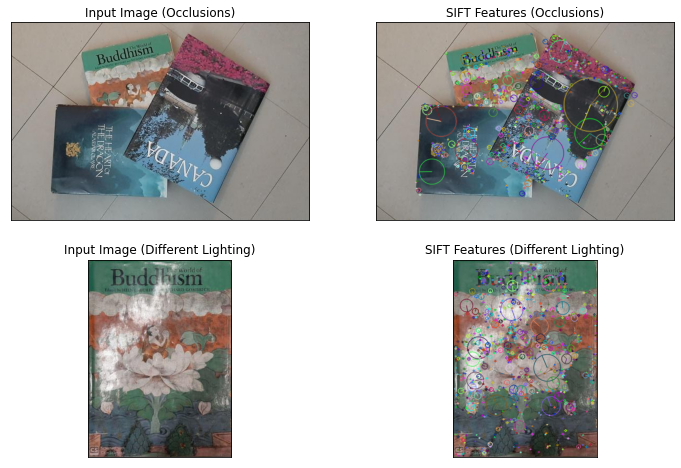

In [ ]:
# load images
img_book_a = cv2.imread(path+"book_occlusion.jpg")
img_book_b = cv2.imread(path+"book_crop.jpg")

# copy images
img_disp_book_a = img_book_a.copy()
img_disp_book_b = img_book_b.copy()

# convert to RGB
img_book_a = cv2.cvtColor(img_book_a, cv2.COLOR_BGR2RGB)
img_disp_book_a = cv2.cvtColor(img_disp_book_a, cv2.COLOR_BGR2RGB)
img_book_b = cv2.cvtColor(img_book_b, cv2.COLOR_BGR2RGB)
img_disp_book_b = cv2.cvtColor(img_disp_book_b, cv2.COLOR_BGR2RGB)

# find SIFT keypoints
keypoints_book_a = sift_keypoints(img_book_a,None)
keypoints_book_b = sift_keypoints(img_book_b,None)

# draw the keypoints
cv2.drawKeypoints(img_book_a, keypoints_book_a, img_disp_book_a, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img_book_b, keypoints_book_b, img_disp_book_b, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(12,8))
plt.subplot(221), plt.imshow(img_book_a)
plt.title("Input Image (Occlusions)"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(img_disp_book_a)
plt.title("SIFT Features (Occlusions)"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(img_book_b)
plt.title("Input Image (Different Lighting)"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(img_disp_book_b)
plt.title("SIFT Features (Different Lighting)"), plt.xticks([]), plt.yticks([])
plt.show()

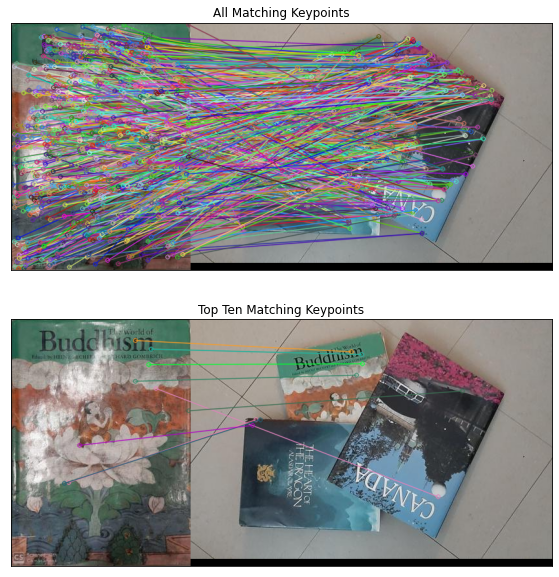

In [ ]:
# display all matching keypoints
match_all_occluded = match_all_keypoints(img_book_b, keypoints_book_b, sift_descriptors(img_book_b,keypoints_book_b), 
                                    img_book_a, keypoints_book_a, sift_descriptors(img_book_a,keypoints_book_a))

# display top ten matching keypoints
match_topten_occluded = match_topten_keypoints(img_book_b, keypoints_book_b, sift_descriptors(img_book_b,keypoints_book_b), 
                                    img_book_a, keypoints_book_a, sift_descriptors(img_book_a,keypoints_book_a))

# display
plt.figure(figsize=(30,10))
plt.subplot(211), plt.imshow(match_all_occluded)
plt.title("All Matching Keypoints"), plt.xticks([]), plt.yticks([])
plt.subplot(212), plt.imshow(match_topten_occluded)
plt.title("Top Ten Matching Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
# function pastes one image on top of another image
# images must be the same size
def pasteImg(img_foreground,img_background):
  img3 = img_background.copy()
  height, width = img_foreground.shape[0:2]
  for i in range(height):
    for j in range(width):
      if (img_foreground[i][j][0] != 0 and img_foreground[i][j][1] != 0 
          and img_foreground[i][j][2] != 0):
        img3[i][j] = img_foreground[i][j]
  return img3

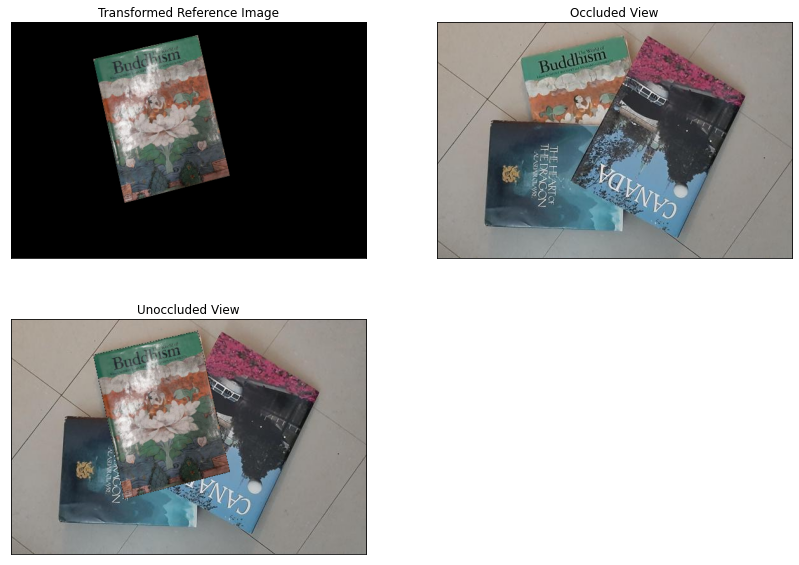

In [ ]:
# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(sift_descriptors(img_book_b,keypoints_book_b),sift_descriptors(img_book_a,keypoints_book_a)) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 145:
        GoodMatches.append((m.trainIdx, m.queryIdx))

# Coordinates of the points in the original plane
mpr = np.float32([keypoints_book_b[i].pt for (__, i) in GoodMatches])
#Coordinates of the points in the target plane
mpl = np.float32([keypoints_book_a[i].pt for (i, __) in GoodMatches])

# find homography and wrap image accordingly
H, __ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)
wimg = cv2.warpPerspective(img_book_b, H, (img_book_a.shape[1],img_book_a.shape[0]))
img_book_c = pasteImg(wimg, img_book_a)

# display
plt.figure(figsize=(14,10))
plt.subplot(221), plt.imshow(wimg)
plt.title("Transformed Reference Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(img_book_a)
plt.title("Occluded View"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(img_book_c)
plt.title("Unoccluded View"), plt.xticks([]), plt.yticks([])
plt.show()

##Face Detection

###Eigenface Representation

In [ ]:
# here, "dataset_faces" is a 2D array
# each column represents different training images
# training images all have the same number of pixels 
def find_avg_face(dataset_faces):
  avg_face = []
  num_rows, num_columns = np.shape(dataset_faces)
  for i in range(num_rows):
    sum = 0
    for j in range(num_columns):
      sum += dataset_faces[i][j]
    avg_face.append(sum/num_columns)
  return avg_face #1D array

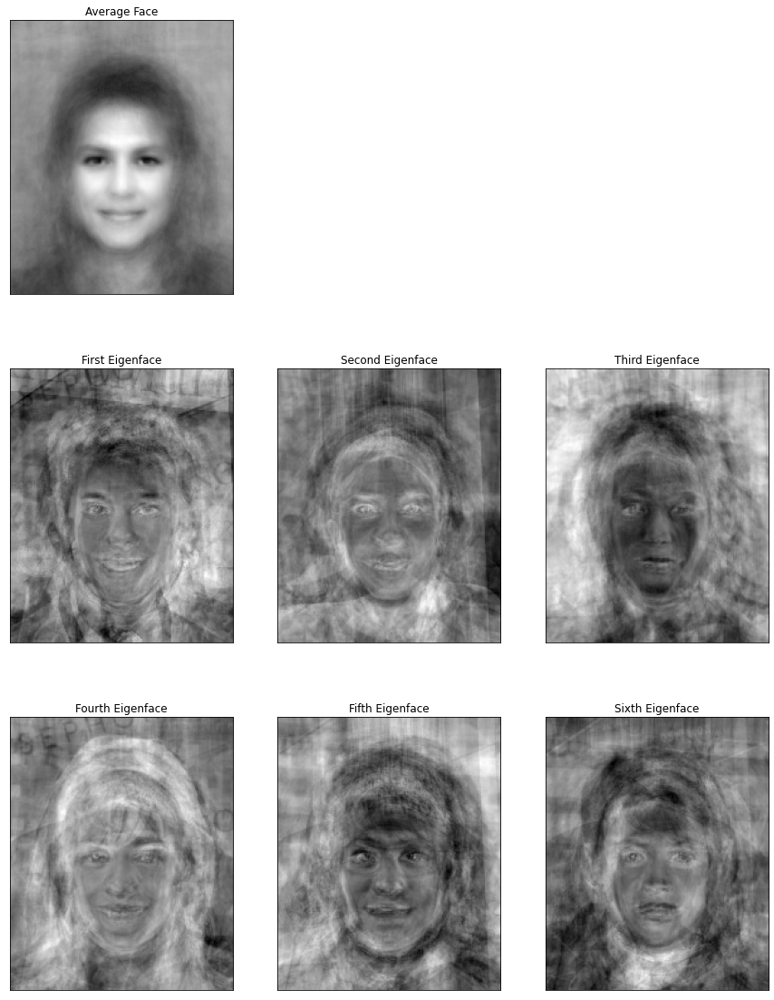

In [ ]:
dataset_path = path + 'celebA_subset/'
files = os.listdir(dataset_path)
dataset_matrix_DT_temp = [] 
dataset_matrix_DT = [] # matrix D^T - each row (100 in total) represents different training images (gray scale) minus the average image
img_shape = (218,178) # image resolution

random.seed(10)
#read 100 random images for training dataset
for i in random.sample(range(0, 1000), 100):
  face_image_temp = cv2.imread(dataset_path + files[i]) 
  face_image_temp_gray = cv2.cvtColor(face_image_temp, cv2.COLOR_BGR2GRAY) # converts image to gray scale
  face_image_temp_gray_1D = face_image_temp_gray.ravel() # converts image to 1D array
  dataset_matrix_DT_temp.append(face_image_temp_gray_1D)

# find the average face of the 100 random face images
dataset_matrix_D_temp = np.transpose(dataset_matrix_DT_temp)
avg_face = find_avg_face(dataset_matrix_D_temp) 

# subtract average face from image dataset
for x in range(100):
  dataset_matrix_DT.append(dataset_matrix_DT_temp[x] - avg_face)

# matrix D (transpose of D^T) - each column (100 in total) represents different training images (gray scale) minus the average face
dataset_matrix_D = np.transpose(dataset_matrix_DT)
  
# Snapshot method
dataset_matrix_DT_D = np.matmul(dataset_matrix_DT,dataset_matrix_D) # matrix D^T*D
eigen_values, eigen_vectors = np.linalg.eig(dataset_matrix_DT_D) # computes eigenvalues and eigenvectors of D^T*D
eigen_values_vectors = zip(eigen_values,eigen_vectors)

# sort eigenvectors based on the absolute value of their eigenvalue (descending order)
eigen_values_vectors_sorted = sorted(eigen_values_vectors, key = lambda t: abs(t[0]), reverse = True) 

eigen_vectors_D_DT = [] # array that stores eigenvectors of D*D^T
for j in eigen_values_vectors_sorted:
  # compute eigenvectors of D*D^T and append to array
  eigen_vector = np.matmul(dataset_matrix_D,j[1])
  mag_eigen = np.sqrt(np.dot(eigen_vector,eigen_vector)) # magnitude of eigen vector
  eigen_vectors_D_DT.append(eigen_vector/mag_eigen) # divide by magnitude of eigen vector to get unit vector

# display first 6 eigenfaces 
plt.figure(figsize=(15,20))
plt.subplot(331), plt.imshow(np.asarray(avg_face).reshape(img_shape), cmap='gray')
plt.title("Average Face"), plt.xticks([]), plt.yticks([])
plt.subplot(334), plt.imshow(np.asarray(eigen_vectors_D_DT[0]).reshape(img_shape), cmap='gray')
plt.title("First Eigenface"), plt.xticks([]), plt.yticks([])
plt.subplot(335), plt.imshow(np.asarray(eigen_vectors_D_DT[1]).reshape(img_shape), cmap='gray')
plt.title("Second Eigenface"), plt.xticks([]), plt.yticks([])
plt.subplot(336), plt.imshow(np.asarray(eigen_vectors_D_DT[2]).reshape(img_shape), cmap='gray')
plt.title("Third Eigenface"), plt.xticks([]), plt.yticks([])
plt.subplot(337), plt.imshow(np.asarray(eigen_vectors_D_DT[3]).reshape(img_shape), cmap='gray')
plt.title("Fourth Eigenface"), plt.xticks([]), plt.yticks([])
plt.subplot(338), plt.imshow(np.asarray(eigen_vectors_D_DT[4]).reshape(img_shape), cmap='gray')
plt.title("Fifth Eigenface"), plt.xticks([]), plt.yticks([])
plt.subplot(339), plt.imshow(np.asarray(eigen_vectors_D_DT[5]).reshape(img_shape), cmap='gray')
plt.title("Sixth Eigenface"), plt.xticks([]), plt.yticks([])
plt.show()

###Face Detection


In [ ]:
def detect_value(eigen_vectors, k_value, average_face, image_patch_1D, window_size, image_shape):
  img_patch_2D = np.asarray(image_patch_1D).reshape(window_size)
  img_patch_2D_new = cv2.resize(img_patch_2D, (image_shape[1],image_shape[0]), 0, 0, cv2.INTER_CUBIC) # resize image patch
  img_patch_1D_new = img_patch_2D_new.ravel()
  img_patch_coefficients = []
  for i in range(k_value):
    coefficient = np.dot(img_patch_1D_new - average_face, eigen_vectors[i]) # find coefficients
    img_patch_coefficients.append(coefficient)
  term = [0 for e in range(len(img_patch_1D_new))] 
  # PCA face detection algorithm
  for j in range(k_value):
    term = term + (eigen_vectors[j] * img_patch_coefficients[j])
  vector_final = img_patch_1D_new - (average_face + term)
  value = np.sqrt(np.dot(vector_final,vector_final))
  return value

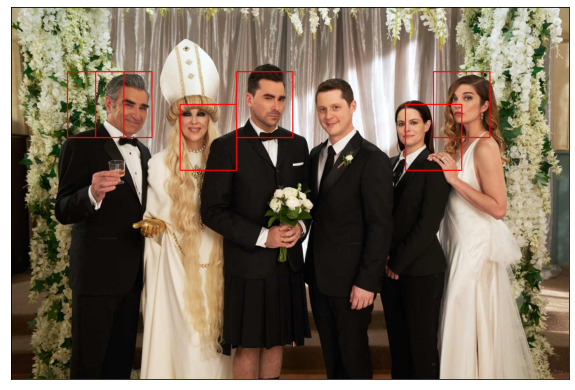

In [ ]:
# read in the image
group_image = cv2.imread(path + 'schitt\'s_creek_group_photo.jpeg')
group_image_gray = cv2.cvtColor(group_image, cv2.COLOR_BGR2GRAY) # converts image to gray scale
group_image_rgb = cv2.cvtColor(group_image, cv2.COLOR_BGR2RGB) # converts image to rgb
window_size = (175,150) # sliding window size
num_rows, num_columns = np.shape(group_image_gray) # size of group image
thresh = 29000 # threshold for face detection
k_value = 75 # number of coefficients/number of eigenfaces

# iterate through group image pixels and find locations where there are faces
face_locations = []
sum = 0
for i in range(0, num_rows - window_size[0], window_size[0]//2):
  for j in range(0, num_columns - window_size[1], window_size[1]//2):
    img_patch = []
    for x in range(window_size[0]):
      for y in range(window_size[1]):
        img_patch.append(group_image_gray[i+x][j+y])
    if detect_value(eigen_vectors_D_DT, k_value, avg_face, img_patch, window_size, img_shape) < thresh:
      face_locations.append((i,j))

for pt in face_locations:
  cv2.rectangle(group_image_rgb,(pt[1],pt[0]),(pt[1]+window_size[1],pt[0]+window_size[0]),(255,0,0),2)

plt.figure(figsize=(10,10))
plt.imshow(group_image_rgb)
plt.xticks([]), plt.yticks([])
plt.show()

This method is far from perfect, but it did manage to detect 5 faces out of the 6 faces in the group image. There was one false positive face detection. 

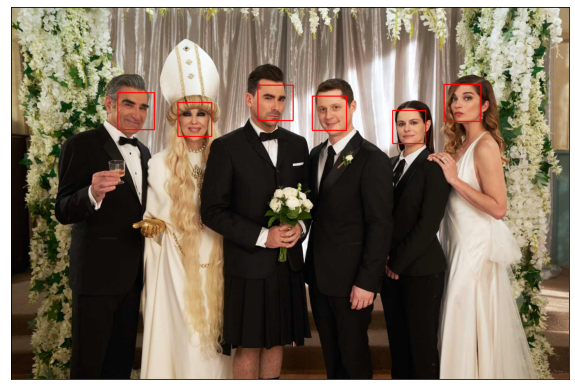

In [ ]:
# Viola-Jones face detector,
group_image_rgb_copy = cv2.cvtColor(group_image, cv2.COLOR_BGR2RGB) 
face_cascade = cv2.CascadeClassifier(path+'haarcascade_frontalface_default.xml')

faces = face_cascade.detectMultiScale(group_image_gray, 1.1, 3, None, (75,75), (100,100))

for (x,y,w,h) in faces:
    group_image_rgb_copy = cv2.rectangle(group_image_rgb_copy,(x,y),(x+w,y+h),(255,0,0),2)

plt.figure(figsize=(10,10))
plt.imshow(group_image_rgb_copy)
plt.xticks([]), plt.yticks([])
plt.show()

This method detects every face in the group image and produces 0 false positive face detections. The Viola-Jones detector will work better than PCA especially when the image contains faces that are different sizes.